# Altair plots
* inspiration and tips from  https://www.districtdatalabs.com/altair-choropleth-viz/

In [2]:
import pandas as pd
import altair as alt
import json
import geopandas as gpd
alt.renderers.enable('notebook') # show and interact ith plots in jupyter notebook
import matplotlib.pyplot as plt
get_ipython().magic(u'matplotlib inline')

In [3]:
df=pd.read_csv('../data/neighbourhoods.csv')
df.head()

,poi_id,name,build_year,build_decade,build_year_clean,demolished_year,address,latitude,longitude,external_url,image_url,heritage_status,current_use,poi_type,poi_type_simple,source,details,style,neighbourhood
0,1,43 Cross Street,unknown,NaN,NaN,NaN,"43 Cross Street Weston York, ON",43.705088,-79.525501,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,Weston Heritage Conservation District,NaN,Detached house,Building,http://www.acotoronto.ca/,NaN,Arts and Crafts,Weston (113)
1,10,J. H. McKinnon House,1888,1880.0,1888.0,NaN,"506 Jarvis Street Church-Wellesley Toronto, ON",43.667350,-79.379120,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,Heritage property,NaN,Detached house,Building,http://www.acotoronto.ca/,NaN,Queen Anne,Church-Yonge Corridor (75)
2,16,121 Major Street,1885,1880.0,1885.0,NaN,"121 Major Street Harbord Village Toronto, ON",43.660810,-79.403780,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,NaN,NaN,Rowhouse,Building,http://www.acotoronto.ca/,NaN,Toronto Bay and Gable,University (79)
3,45,22 Chestnut Park,1905,1900.0,1905.0,NaN,"22 Chestnut Park Rosedale Toronto, ON",43.679380,-79.388100,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,South Rosedale Heritage Conservation District,NaN,Detached house,Building,http://www.acotoronto.ca/,"First Occupant: Falconbridge, John D.\r\r\r\r\...",American colonial,Rosedale-Moore Park (98)
4,60,23-25 Gifford Street,unknown,NaN,NaN,NaN,"23-25 Gifford Street Cabbagetown Toronto, ON",43.663470,-79.363190,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,Cabbagetown South Heritage Conservation District,NaN,Semi-detached house,Building,http://www.acotoronto.ca/,NaN,Arts and Crafts,Cabbagetown-South St.James Town (71)


In [4]:
geo_json_file_loc= '../data/toronto_crs84.geojson'
shape_file_loc = '../data/Neighbourhoods/NEIGHBORHOODS_WGS84.shp'


def open_geojson():
    with open(geo_json_file_loc) as json_data:
        d = json.load(json_data)
    return d

def get_gpd_df(use_shape_file=True):
    '''
    Load area boundaries from a shape file or geojson file
    '''
    if use_shape_file:
        gdf = gpd.read_file(shape_file_loc)
    else:
        toronto_json = open_geojson()
        gdf = gpd.GeoDataFrame.from_features((toronto_json))
    return gdf

In [5]:
def create_choro_data(df, gdf):
    gdf = gdf.merge(df, left_on='AREA_NAME', right_on='neighbourhood', how='inner')
    choro_json = json.loads(gdf.to_json())
    choro_data = alt.Data(values=choro_json['features'])
    return choro_data

In [6]:
def gen_map(geodata, color_column, title, tooltip, color_scheme='bluegreen'):
    '''
    Generates Toronto neighbourhoods map with building count choropleth
    '''
    
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=600,
        height=600
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='quantitative', 
                  scale=alt.Scale(scheme=color_scheme),
                  title = "Building Counts"),
         tooltip=tooltip
    )

    return base + choro

In [7]:
def plot_where_style_found(df, style):
    
    
    all_neighbourhoods = list(df['neighbourhood'].unique())
    
    df_style=df[df['style']==style].groupby(['neighbourhood'])['poi_id'].count().reset_index()
    df_style=df_style.rename(columns={'poi_id':'count_buildings'})
    df_style.sort_values('count_buildings', ascending=False, inplace=True)
    
    # flesh out dataframe with zeros for all neighbourhoods no buildings of this style so have complete map
    new_areas = []
    for neighbourhood in all_neighbourhoods:
        if (neighbourhood in df_style['neighbourhood'].values) == False:
            dict_area = {'neighbourhood': neighbourhood, 'count_buildings': 0}
            new_areas.append(dict_area)
    df_style=df_style.append(new_areas)
    
    # prep plot
    gdf=get_gpd_df()
    choro_data = create_choro_data(df_style, gdf)
    toronto_map = gen_map(geodata=choro_data, color_column='properties.count_buildings', title=f'Location of {style} style houses in Toronto', tooltip=['properties.AREA_NAME:O','properties.count_buildings:Q'], color_scheme='yelloworangered')
    return toronto_map

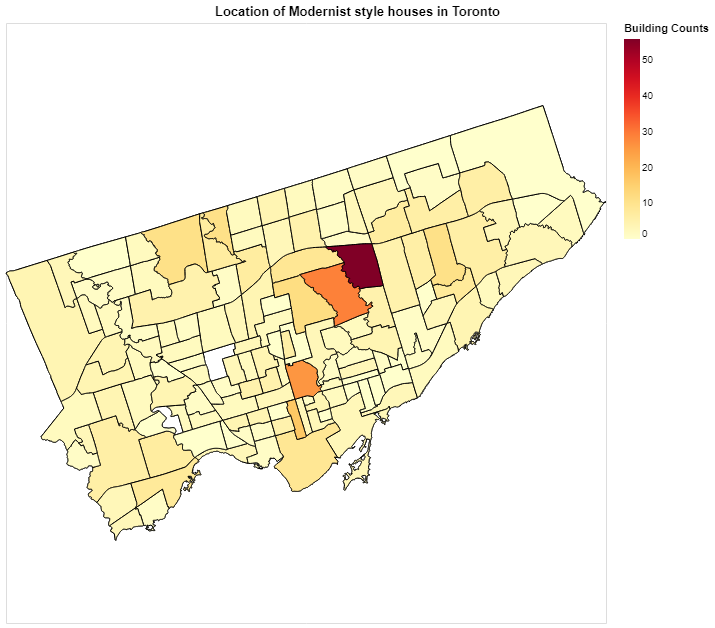

In [8]:
plot_where_style_found(df,'Modernist')

In [ ]:
styles=['Modernist', 'Postmodern', 'Second empire', 'Queen Anne', 'Toronto Bay and Gable','Gothic revival','Georgian revival']
for astyle in styles:
    amap=plot_where_style_found(df,astyle)
    amap.display()

## Plot by Building Age

In [20]:
def plot_by_building_age(df, older_than):
    
    all_neighbourhoods = list(df['neighbourhood'].unique())
    
    df_age=df[df['build_decade']<older_than].groupby(['neighbourhood'])['poi_id'].count().reset_index()
    df_age=df_age.rename(columns={'poi_id':'count_buildings'})
    df_age.sort_values('count_buildings', ascending=False, inplace=True)
     # flesh out dataframe with zeros for all neighbourhoods no buildings of this style so have complete map
    new_areas = []
    for neighbourhood in all_neighbourhoods:
        if (neighbourhood in df_age['neighbourhood'].values) == False:
            dict_area = {'neighbourhood': neighbourhood, 'count_buildings': 0}
            new_areas.append(dict_area)
    df_age=df_age.append(new_areas)
    
    # prep plot
    gdf=get_gpd_df()
    choro_data = create_choro_data(df_age, gdf)
    toronto_map = gen_map(geodata=choro_data, color_column='properties.count_buildings', title=f'Location of buildings older than {older_than} in Toronto', tooltip=['properties.AREA_NAME:O','properties.count_buildings:Q'], color_scheme='yelloworangered')
    return toronto_map

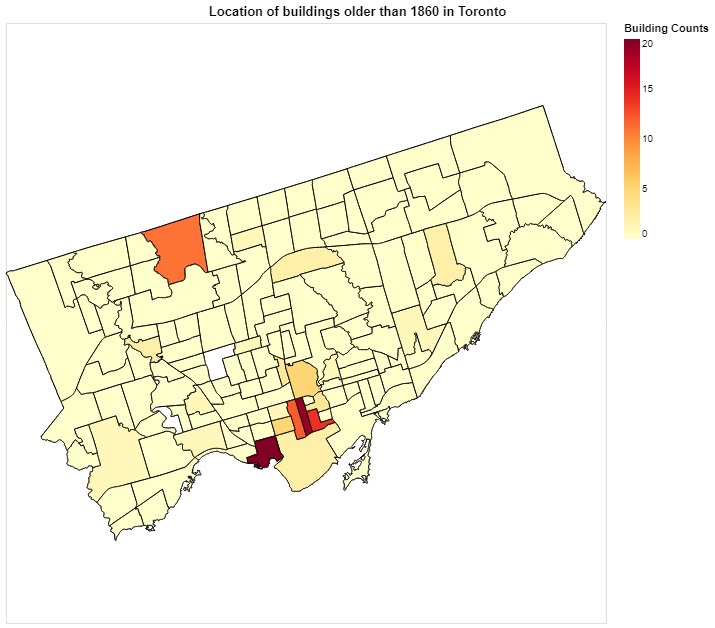

In [24]:
plot_by_building_age(df, 1860)

#### FInd most common style per neighbourhood

In [32]:
df2=df.groupby(['neighbourhood','style'])['poi_id'].count().reset_index()
df_most_common_style=df2.groupby(['neighbourhood']).max().reset_index()
df_most_common_style.head()

,neighbourhood,style,poi_id
0,Agincourt North (129),Postmodern,7
1,Agincourt South-Malvern West (128),Second empire,6
2,Alderwood (20),Postmodern,3
3,Annex (95),Workers Cottage,77
4,Banbury-Don Mills (42),Sculptural,29


In [33]:
# prep plot
gdf=get_gpd_df()
choro_data = create_choro_data(df_most_common_style, gdf)
# toronto_map = gen_map(geodata=choro_data, color_column='properties.count_buildings', title=f'Location of buildings older than {older_than} in Toronto', tooltip=['properties.AREA_NAME:O','properties.count_buildings:Q'], color_scheme='yelloworangered')
# return toronto_map

In [68]:
def gen_map_cat(geodata, color_column, title, tooltip, color_scheme='bluegreen'):
    '''
    Generates Toronto neighbourhoods map with building count choropleth
    '''
    
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=600,
        height=600
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='nominal', 
                  scale=alt.Scale(scheme=color_scheme),
                  title = "Building Counts"),
         tooltip=tooltip
    )

    return base + choro

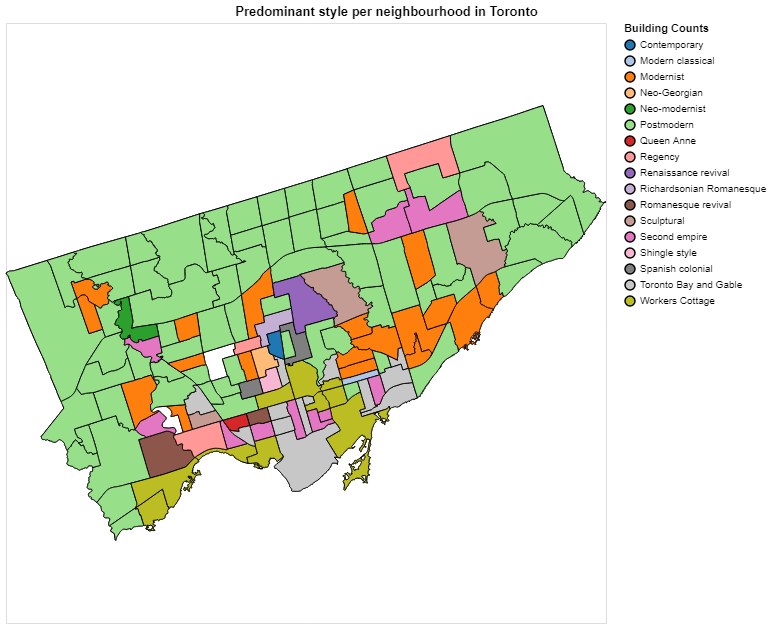

In [69]:
toronto_map = gen_map_cat(geodata=choro_data, color_column='properties.style', title=f'Predominant style per neighbourhood in Toronto',
                      tooltip=['properties.AREA_NAME:O', 'properties.style:N'], color_scheme='category20')
toronto_map

In [92]:
def gen_map_cat2(geodata, color_column, title, tooltip, color_scheme='bluegreen'):
    '''
    Generates Toronto neighbourhoods map with building count choropleth
    '''

    selection = alt.selection_multi(fields=[color_column]) 

    color = alt.condition(selection,
              alt.Color(color_column, type='nominal',
              scale=alt.Scale(scheme=color_scheme)),
              alt.value('lightgray'))

    
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=600,
        height=600
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        color=color,
         tooltip=tooltip
    ).add_selection(
        selection
    )
    
#     legend = alt.Chart(geodata
#     ).mark_geoshape(filled=True, size=200
#     ).encode(
#         y=alt.Y(color_column, type='nominal', axis=alt.Axis(orient='right')),
#         color=color
#     ).add_selection(
#         selection
#     )

    return base + choro #+ legend

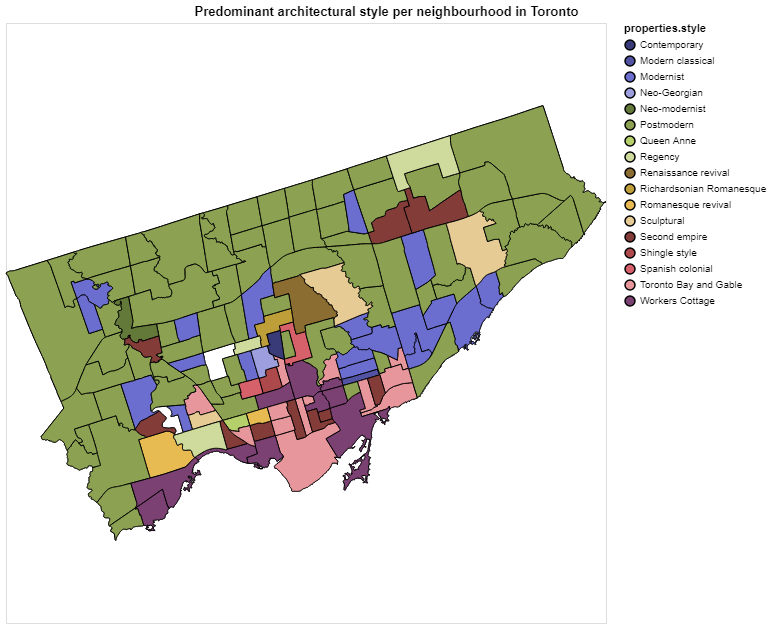

In [95]:
toronto_map = gen_map_cat2(geodata=choro_data, color_column='properties.style', title=f'Predominant architectural style per neighbourhood in Toronto',
                      tooltip=['properties.AREA_NAME:O','properties.style:N'], color_scheme='category20b')
toronto_map

In [96]:
#toronto_map.to_html()
html = toronto_map.to_html()
with open('predominant_styles_by_neighbhourhood.html', 'w') as f:
    f.write(html)